<a href="https://colab.research.google.com/github/Dejan-Cugalj/MASTER-TEZA/blob/main/PROGRAMSKI_JEZICI_DS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predmet: **"Programski jezici Data science"**
#### *Prof. dr. Vladislav Miškovic || Prof. dr. Miodrag Živković*
---
# Testiranje "*MAF*" (**M**ass **A**ir **F**low sensor) senzora protoka vazduha motora
### Student: **Dejan Čugalj (2019/430054)**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


 ### Importovanje neophodnog alata iz biblioteka

In [35]:
# Sistemske
import datetime, os, time
# Numerika
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
# Linearna Regresija
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
#Evaluacija
import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
import statsmodels.api as sm
#Grafika
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
print("*********** Ucitane Biblioteke... ********************\n")


*********** Ucitane Biblioteke... ********************



>> ### Učitavanje dataseta podataka iz lokalnog .csv fajla

In [36]:
#url = '/content/drive/MyDrive/Colab Notebooks/CAN-DATASET/GOLF-4-SENZORA/GOLF-TRENING-DATASET-CSV.csv' # Uneti putanju do preuzetog dataseta

url = '/content/drive/MyDrive/Colab Notebooks/CAN-DATASET/MASTER DATASET/golf-master-canbus_dataset.csv' # Uneti putanju do preuzetog dataseta
print("*********** Ucitan DATASET... ********************\n")

*********** Ucitan DATASET... ********************



# 1. Preprocesuiranje podataka

> **LEGENDA DATASETA:**

*   **RPM** - **R**EVOLUTIONS **P**ER **M**INUTE sensor
*   **MAP** - **M**ANIFOLD **A**BSOLUTE **P**RESSURE sensor
*   **FGP** - **F**UEL **G**AUGE **P**RESSURE sensor
*   **IAT** - **I**NTAKE **A**IR **T**EMPERATURE sensor
*   **ECT** - **E**NGINE **C**OOLANT **T**EMPERATURE sensor
*   **CEL** - **C**ALCULATED **E**NGINE **L**OAD
*   **ABP** - **A**BSOLUTE **B**AROMETRIC **P**RESSURE
*   **MAF** - **M**ASS **A**IR **F**LOW sensor 








In [37]:

dataset = pd.read_csv(url ,sep=',', usecols = ['RPM', 'MAP', 'FGP', 'MAF'])
dataset.columns=['RPM', 'MAP', 'FGP', 'MAF']
 
print("*********** DATASET ********************\n")
print(dataset.head(10))

*********** DATASET ********************

      RPM  MAP    FGP    MAF
0  946.00   87  23580  11.42
1  947.00   87  23730  11.52
2  950.75   87  25820  11.87
3  945.50   87  24510  11.26
4  951.25   87  25050  11.38
5  950.00   87  26700  11.90
6  949.50   87  25870  10.98
7  949.00   87  26180  11.44
8  951.00   87  26810  11.05
9  949.25   87  25930  11.41


> ### 1.1 Kreiranje Pandas Data-Frejma

In [38]:
# Odbacivanje obeležija koje nisu u korelaciji
#dataset.drop(['IAT', 'ECT', 'CEL', 'ABP'], axis=1, inplace=True)
 
X = dataset.iloc[:, :-1].values # Alokacija Matrice Obeležija / Nezavisnih Promenjivih (eng. Independent variables)
y = dataset.iloc[:, -1].values # Alokacija Zavisne Promenjive (eng. Dependent variable) MAF sernzora automobila
print("**************************************************************")
print("**************** KREIRAN PANDAs DATA FREJM ******************")
print("**************************************************************\n")
print("*************************   X   ************************\n")
print(X)
print("\n\n\n*************************   y   ************************\n")
print(y)

**************************************************************
**************** KREIRAN PANDAs DATA FREJM ******************
**************************************************************

*************************   X   ************************

[[  946.      87.   23580.  ]
 [  947.      87.   23730.  ]
 [  950.75    87.   25820.  ]
 ...
 [  878.75    87.   24510.  ]
 [  879.25    87.   26730.  ]
 [  878.75    87.   23680.  ]]



*************************   y   ************************

[11.42 11.52 11.87 ...  9.41  9.5   9.57]


# 2 Sticanje uvida u prirodu podataka

> ### 2.1 Dataset info

In [39]:
print("*******************************************")
print("**************** DATASET ******************")
print("*******************************************")
print(dataset.head(10))
print("\n*****************************************************")
print("*************** PRIKAZ INDEX POLJA ******************")
print("*****************************************************")
print(dataset.keys()) # Prikaz indexa
print("\n********************************************************************")
print("*********** Prikaz polja ukoliko postoje ""NaN"" vrednosti ************")
print("********************************************************************")
print(dataset.isnull().sum()) # Prikaz polja ukoliko postoije "NaN" vrednosti 
print("\n**********************************************************************")
print("**************** Prikaz oblika učitanog dataseta *********************")
print("**********************************************************************")
print(dataset.shape) # Prikaz oblika učitanog dataseta
print("\n****************************************************")
print("******************** Dataset Info ******************")
print("****************************************************")
print(dataset.info()) # Prikaz oblika učitanog dataseta

*******************************************
**************** DATASET ******************
*******************************************
      RPM  MAP    FGP    MAF
0  946.00   87  23580  11.42
1  947.00   87  23730  11.52
2  950.75   87  25820  11.87
3  945.50   87  24510  11.26
4  951.25   87  25050  11.38
5  950.00   87  26700  11.90
6  949.50   87  25870  10.98
7  949.00   87  26180  11.44
8  951.00   87  26810  11.05
9  949.25   87  25930  11.41

*****************************************************
*************** PRIKAZ INDEX POLJA ******************
*****************************************************
Index(['RPM', 'MAP', 'FGP', 'MAF'], dtype='object')

********************************************************************
*********** Prikaz polja ukoliko postoje NaN vrednosti ************
********************************************************************
RPM    0
MAP    0
FGP    0
MAF    0
dtype: int64

**********************************************************************
******

> ### 2.2 Prikaz korelacione matrice (numerički)

In [40]:
print("\n*******************************************************************")
print("***************** Numerička Korelaciona Matrica *******************")
print("*******************************************************************")
print(dataset.info()) # dataset info
corrMatrix = dataset.corr()
print (corrMatrix) # Numrerički prikaz korelacione matrice


*******************************************************************
***************** Numerička Korelaciona Matrica *******************
*******************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2759 entries, 0 to 2758
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RPM     2759 non-null   float64
 1   MAP     2759 non-null   int64  
 2   FGP     2759 non-null   int64  
 3   MAF     2759 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 86.3 KB
None
          RPM       MAP       FGP       MAF
RPM  1.000000  0.913430  0.957484  0.984641
MAP  0.913430  1.000000  0.922442  0.953109
FGP  0.957484  0.922442  1.000000  0.974711
MAF  0.984641  0.953109  0.974711  1.000000


> ### 2.3 Prikaz korelacione matrice (grafički)


*******************************************************************
***************** Grafička Korelaciona Matrica ********************
*******************************************************************


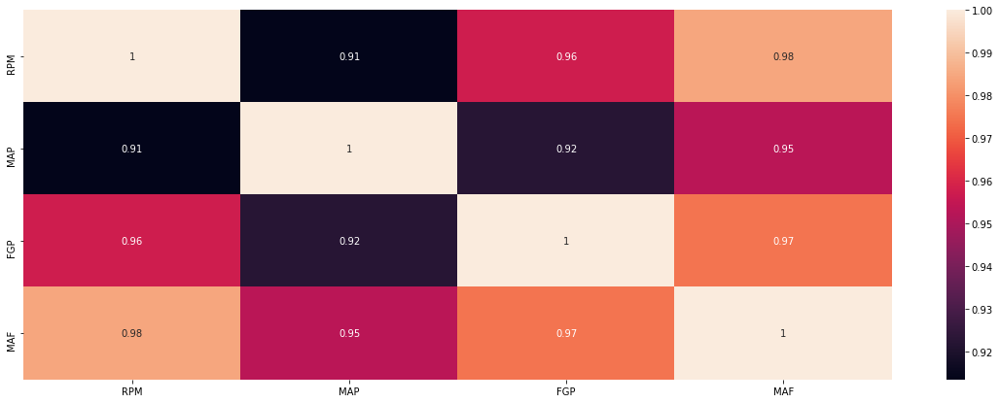

In [41]:
# Grafički prikaz korelacione matrice
print("\n*******************************************************************")
print("***************** Grafička Korelaciona Matrica ********************")
print("*******************************************************************")
 
plt.figure(figsize=(20,7))
sns.heatmap(corrMatrix, annot=True, square=False)

> ### 2.4 Prikaz histograma

In [ ]:
# Histogram (RPM, MAP, FGP, MAF) zajedno
# Skaliranje Obeležija (eng. Feature Scaling)
sc = StandardScaler()
podaci = sc.fit_transform(dataset)
#tf.keras.utils.normalize(dataset, axis = 1)
podaci_dataframe = pd.DataFrame(podaci) # Iz 'ndarray' u Pandas Data-Frame
podaci_dataframe.columns = ['RPM','MAP','FGP','MAF']
podaci_dataframe.plot.hist(bins=50)
 
# Histogram (RPM, MAP, FGP, MAF) odvojeno
podaci_dataframe.hist()

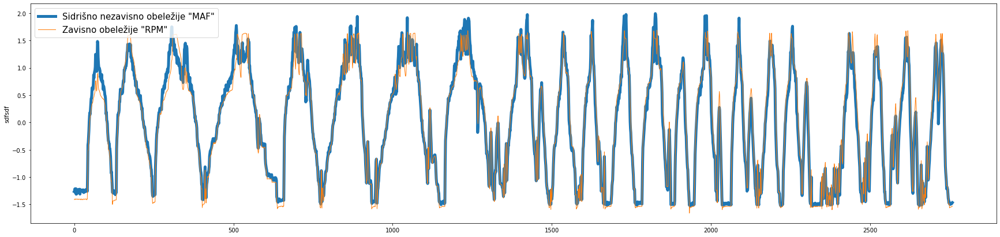

In [83]:
plt.figure(figsize=(30,7))
plt.plot(podaci_dataframe.MAF, label='Sidrišno nezavisno obeležije "MAF"', linewidth=5) # Sidrišno nezavisno obeležije "RPM"
plt.plot(podaci_dataframe.RPM, label='Zavisno obeležije "RPM"', linewidth=1) # Zavisno obeležije "MAP"
plt.legend(loc="upper left", fontsize=15)
plt.ylabel('sdfsdf');
plt.xlabel('');

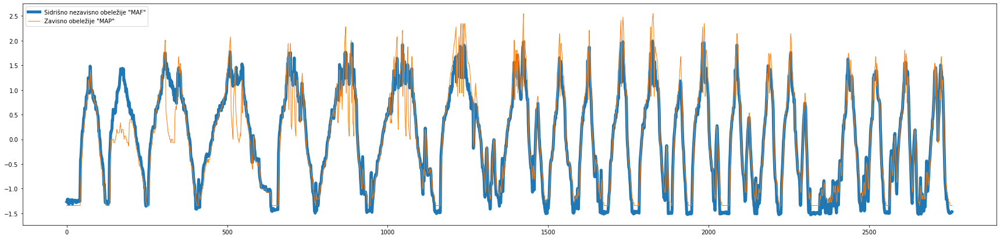

In [32]:
plt.figure(figsize=(30,7))
plt.plot(podaci_dataframe.MAF, label='Sidrišno nezavisno obeležije "MAF"', linewidth=5) # Sidrišno nezavisno obeležije "RPM"
plt.plot(podaci_dataframe.MAP, label='Zavisno obeležije "MAP"', linewidth=1) # Zavisno obeležije "MAP"
plt.legend(loc="upper left")
plt.ylabel('');
plt.xlabel('');

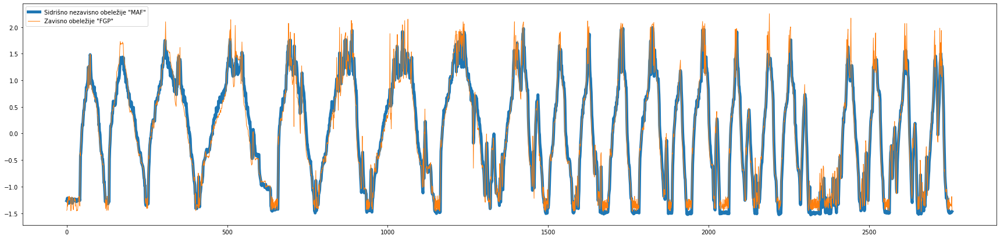

In [33]:
plt.figure(figsize=(30,7))
plt.plot(podaci_dataframe.MAF, label='Sidrišno nezavisno obeležije "MAF"', linewidth=5) # Sidrišno nezavisno obeležije "RPM"
plt.plot(podaci_dataframe.FGP, label='Zavisno obeležije "FGP"', linewidth=1) # Zavisno obeležije "MAP"
plt.legend(loc="upper left")
plt.ylabel('');
plt.xlabel('');

# 3 Uporedna analiza sidrišnog obeležija nezavisne promenjive sa zavisnim

> ### 3.1 Grafički prikaz svih obeležija

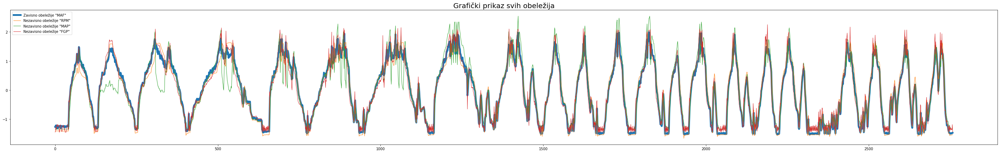

In [43]:

plt.figure(figsize=(50,7))
plt.plot(podaci_dataframe.MAF, label='Zavisno obeležije "MAF"', linewidth=5) # Zavisno obeležije "MAF"
plt.plot(podaci_dataframe.RPM, label='Nezavisno obeležije "RPM"', linewidth=1) # Sidrišno nezavisno obeležije "RPM"
plt.plot(podaci_dataframe.MAP, label='Nezavisno obeležije "MAP"', linewidth=1) # Zavisno obeležije "MAP"
plt.plot(podaci_dataframe.FGP, label='Nezavisno obeležije "FGP"', linewidth=1) # Zavisno obeležije "FGP"
# plt.plot(podaci_dataframe.EGR, label='Zavisno obeležije "EGR"', linewidth=1) # Zavisno obeležije "FGP"

plt.title("Grafički prikaz svih obeležija", fontsize=20) 
plt.legend(loc="upper left")
plt.ylabel('');
plt.xlabel('');
plt.show()

# 4 Razdvajanje podataka na obeležija (X) i izlaznu varijablu (y)

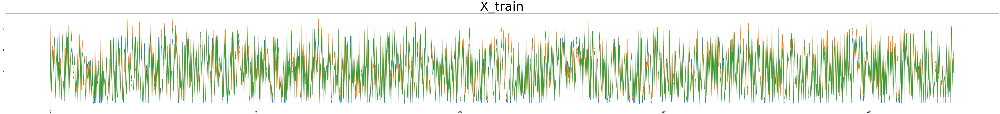

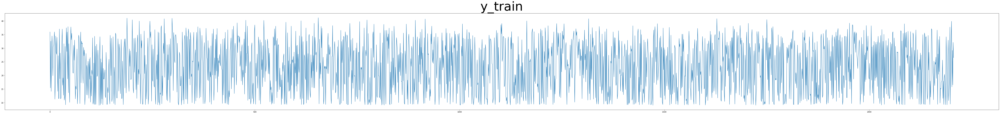

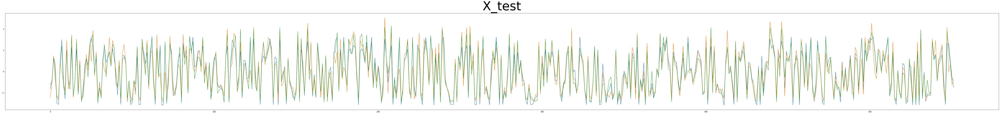

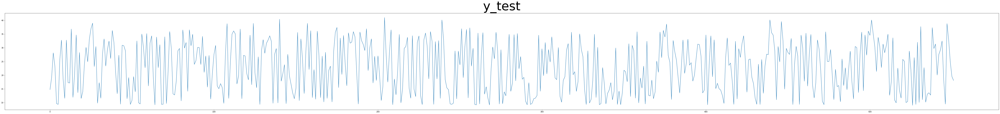

In [ ]:
# Razdvajanje podataka
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
 
# Normalizacija obležija
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
 
# Grafički prikaz - Plot rezultata svih obležija
plt.figure(figsize=(100,10))
plt.plot(X_train)
plt.title("X_train", fontsize=70, color='black') 
plt.show()
 
plt.figure(figsize=(100,10))
plt.plot(y_train)
plt.title("y_train", fontsize=70, color='black') 
plt.show()
 
plt.figure(figsize=(100,10))
plt.plot(X_test)
plt.title("X_test", fontsize=70, color='black') 
plt.show()
 
 
plt.figure(figsize=(100,10))
plt.plot(y_test)
plt.title("y_test", fontsize=70, color='black') 
plt.show()

# 5 Izbor metode mašinskog učenja predikcije rezultata

###5.1 LINEARNA REGRESIJA (*Linear Regression*)


*********** DATASET keys()********************
Index(['RPM', 'MAF'], dtype='object')

*********** DATASET isnull()********************
RPM    0
MAF    0
dtype: int64

*********** DATASET shape()********************
(2759, 2)

*********** DATASET info()********************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2759 entries, 0 to 2758
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RPM     2759 non-null   float64
 1   MAF     2759 non-null   float64
dtypes: float64(2)
memory usage: 43.2 KB
None
          RPM       MAF
RPM  1.000000  0.984641
MAF  0.984641  1.000000


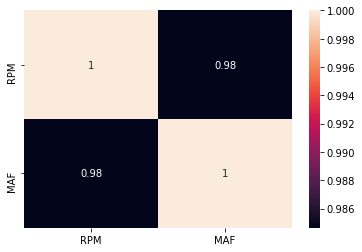

In [44]:
# Importing the dataset
#dataset_lr = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CAN-DATASET/GOLF-4-SENZORA/GOLF-TRENING-DATASET-CSV.csv', usecols = ['FGP(kPa)', 'MAF(grams/sec)'])
dataset_lr = pd.read_csv(url, usecols = ['RPM', 'MAF'])
dataset_lr.columns=['RPM','MAF']
print("\n*********** DATASET keys()********************")
print(dataset_lr.keys())
print("\n*********** DATASET isnull()********************")
print(dataset_lr.isnull().sum())
print("\n*********** DATASET shape()********************")
print(dataset_lr.shape)
print("\n*********** DATASET info()********************")
print(dataset_lr.info())
corrMatrix_lr = dataset_lr.corr()
print (corrMatrix_lr) # Numrerički prikaz korelacione matrice
sns.heatmap(corrMatrix_lr, annot=True)

In [ ]:
X_lr = dataset_lr.iloc[:, :-1].values
y_lr = dataset_lr.iloc[:, -1].values

# Razdvajanje na trerning i testni skup
from sklearn.model_selection import train_test_split
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_lr, y_lr, test_size = 0.2, random_state = 0)

# Normalizacija obležija
#sc = StandardScaler()
#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

# Linearna Regresija trerning nad testnim setom
regressor_lr = LinearRegression()
regressor_lr.fit(X_train_lr, y_train_lr)

# Predikcija Test set rezultata
y_pred_lr = regressor_lr.predict(X_test_lr)

# Vizualizacija rezultata nad trerning setom 
plt.figure(figsize=(30,5))
plt.scatter(X_train_lr, y_train_lr, color = 'red')
plt.plot(X_train_lr, regressor_lr.predict(X_train_lr), color = 'blue')
plt.title('RPM vs MAF (Training set)')
plt.xlabel('RPM')
plt.ylabel('MAF')
plt.show()

# Vizualizacija rezultata nad testnim setom
plt.figure(figsize=(30,5))
plt.scatter(X_test_lr, y_test_lr, color = 'red')
plt.plot(X_train_lr, regressor_lr.predict(X_train_lr), color = 'blue')
plt.title('RPM vs MAF (Test set)')
plt.xlabel('RPM')
plt.ylabel('MAF')
plt.show()


###5.1.1 Evaluacija naučenog modela Linearne Regresije

In [81]:
# Evaluacija naučenog modela Linearne Regresije
print('****************************************************************************************')
print('*********** Evaluacija naučenog modela Linearne Regresije - TESTNI PODACI **************')
print('****************************************************************************************')

est_lr = sm.OLS(y_test_lr, y_pred_lr)
est2_lr  = est_lr.fit()
print(est2_lr.summary())

print('Mean squared error: %.2f'
      % mean_squared_error(y_test_lr, y_pred_lr))
print('Coefficient of determination: %.2f'
      % r2_score(y_test_lr, y_pred_lr))
mse_lr = mean_squared_error(y_test_lr, y_pred_lr)
print("\nRegresiono stablo:")
print("Srednja kvadratna greška na testnom skupu (MSE) =", round(mse_lr, 2))
evs_lr = explained_variance_score(y_test_lr, y_pred_lr) 
print('Coefficient of determination: %.2f'  % evs_lr)

print('****************************************************************************************')
print('****************************************************************************************')
print('****************************************************************************************')
print('****************************************************************************************')


print(y_test_lr.shape)
print(y_pred_lr.shape)
print(mean_absolute_error(y_test_lr, y_pred_lr))
print(mean_squared_error(y_test_lr, y_pred_lr))
print(mean_squared_error(y_test_lr, y_pred_lr, squared=True))
print(r2_score(y_test_lr, y_pred_lr))

****************************************************************************************
*********** Evaluacija naučenog modela Linearne Regresije - TESTNI PODACI **************
****************************************************************************************
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.993
Model:                            OLS   Adj. R-squared (uncentered):              0.993
Method:                 Least Squares   F-statistic:                          8.107e+04
Date:                Tue, 25 May 2021   Prob (F-statistic):                        0.00
Time:                        00:37:05   Log-Likelihood:                         -1173.8
No. Observations:                 552   AIC:                                      2350.
Df Residuals:                     551   BIC:                                      2354.
Df Model:                    

In [76]:
dataset_lr = pd.read_csv(url, usecols = ['MAP', 'MAF'])
dataset_lr.columns=['MAP','MAF']
X_lr = dataset_lr.iloc[:, :-1].values
y_lr = dataset_lr.iloc[:, -1].values

# Razdvajanje na trerning i testni skup
from sklearn.model_selection import train_test_split
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_lr, y_lr, test_size = 0.2, random_state = 0)

# Normalizacija obležija
#sc = StandardScaler()
#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

# Linearna Regresija trerning nad testnim setom
regressor_lr = LinearRegression()
regressor_lr.fit(X_train_lr, y_train_lr)

# Predikcija Test set rezultata
y_pred_lr = regressor_lr.predict(X_test_lr)
est_lr = sm.OLS(y_test_lr, y_pred_lr)
est2_lr  = est_lr.fit()
print(est2_lr.summary())
print(y_test_lr.shape)
print(y_pred_lr.shape)
print(mean_absolute_error(y_test_lr, y_pred_lr))
print(mean_squared_error(y_test_lr, y_pred_lr))
print(r2_score(y_test_lr, y_pred_lr))


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.988
Model:                            OLS   Adj. R-squared (uncentered):              0.988
Method:                 Least Squares   F-statistic:                          4.362e+04
Date:                Mon, 24 May 2021   Prob (F-statistic):                        0.00
Time:                        23:25:09   Log-Likelihood:                         -1343.2
No. Observations:                 552   AIC:                                      2688.
Df Residuals:                     551   BIC:                                      2693.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [77]:
dataset_lr = pd.read_csv(url, usecols = ['FGP', 'MAF'])
dataset_lr.columns=['FGP','MAF']
X_lr = dataset_lr.iloc[:, :-1].values
y_lr = dataset_lr.iloc[:, -1].values

# Razdvajanje na trerning i testni skup
from sklearn.model_selection import train_test_split
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_lr, y_lr, test_size = 0.2, random_state = 0)

# Normalizacija obležija
#sc = StandardScaler()
#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)

# Linearna Regresija trerning nad testnim setom
regressor_lr = LinearRegression()
regressor_lr.fit(X_train_lr, y_train_lr)

# Predikcija Test set rezultata
y_pred_lr = regressor_lr.predict(X_test_lr)
est_lr = sm.OLS(y_test_lr, y_pred_lr)
est2_lr  = est_lr.fit()
print(est2_lr.summary())
print(y_test_lr.shape)
print(y_pred_lr.shape)
print(mean_absolute_error(y_test_lr, y_pred_lr))
print(mean_squared_error(y_test_lr, y_pred_lr))
print(r2_score(y_test_lr, y_pred_lr))

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.993
Model:                            OLS   Adj. R-squared (uncentered):              0.993
Method:                 Least Squares   F-statistic:                          8.107e+04
Date:                Mon, 24 May 2021   Prob (F-statistic):                        0.00
Time:                        23:25:17   Log-Likelihood:                         -1173.8
No. Observations:                 552   AIC:                                      2350.
Df Residuals:                     551   BIC:                                      2354.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
# Uporedna analiza podataka predikcije i stvarnih vrednosti
print('**********************************************************************')
print('*********** NUMERIČKA UPOREDNA ANALIZA - TESTNI PODACI *************')
print('**********************************************************************')
print("Leva kolona: PREDIKCIJA  ||  Desna kolona: TESTNI VREDNOSTI")
print('**********************************************************************')
np.column_stack((y_pred_lr,y_test_lr))

**********************************************************************
*********** NUMERIČKA UPOREDNA ANALIZA - TESTNI PODACI *************
**********************************************************************
Leva kolona: PREDIKCIJA  ||  Desna kolona: TESTNI VREDNOSTI
**********************************************************************


array([[15.78353866, 14.78      ],
       [19.37809233, 19.17      ],
       [29.10305477, 28.15      ],
       ...,
       [27.82257349, 24.84      ],
       [20.56651287, 19.5       ],
       [19.12283299, 18.12      ]])



---



- ***Provera jednog frejma*** (*Linearna Regresija*)

In [ ]:
print('RPM = 1066\nOčekivana vrednost MAF senzora = 25.15\n')
print("Predikciona vrednost MAF senzora: " + str(regressor_lr.predict([[1783]])))

RPM = 1066
Očekivana vrednost MAF senzora = 25.15

Predikciona vrednost MAF senzora: [24.30334224]


###5.2 VIŠETRUKA LINEARNA REGRESIJA (*Multiple linear Regression*)

- **UČITAVANJE DATASETA**

In [19]:
#url = '/content/drive/MyDrive/Colab Notebooks/CAN-DATASET/TESTNI DATASETovi/BIG-DATASET-1.csv' # Uneti putanju do preuzetog dataseta
#dataset_mlr = pd.read_csv(url ,sep=',', usecols = ['RPM', 'MAP', 'FGP', 'MAF'])
dataset_mlr = pd.read_csv(url ,sep=',', usecols = ['RPM', 'MAP', 'FGP', 'MAF'])
dataset_mlr.columns=['RPM', 'MAP', 'FGP', 'MAF']
 
print("*********** DATASET ********************\n")
print(dataset_mlr.head(10))

print("\n*********** DATASET keys()********************")
print(dataset_mlr.keys())
print("\n*********** DATASET isnull()********************")
print(dataset_mlr.isnull().sum())
print("\n*********** DATASET shape()********************")
print(dataset_mlr.shape)
print("\n*********** DATASET info()********************")
print(dataset_mlr.info())


*********** DATASET ********************

      RPM  MAP    FGP    MAF
0  946.00   87  23580  11.42
1  947.00   87  23730  11.52
2  950.75   87  25820  11.87
3  945.50   87  24510  11.26
4  951.25   87  25050  11.38
5  950.00   87  26700  11.90
6  949.50   87  25870  10.98
7  949.00   87  26180  11.44
8  951.00   87  26810  11.05
9  949.25   87  25930  11.41

*********** DATASET keys()********************
Index(['RPM', 'MAP', 'FGP', 'MAF'], dtype='object')

*********** DATASET isnull()********************
RPM    0
MAP    0
FGP    0
MAF    0
dtype: int64

*********** DATASET shape()********************
(2759, 4)

*********** DATASET info()********************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2759 entries, 0 to 2758
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RPM     2759 non-null   float64
 1   MAP     2759 non-null   int64  
 2   FGP     2759 non-null   int64  
 3   MAF     2759 non-null   float64
dtype



---



- **GRAFIČKI PRIKAZ KORELACIONE MATRICE**


************************************************************************************************
***************** Grafička Korelaciona Matrica (Multiple linear Regression) ********************
************************************************************************************************

*********** NUMERIČKA********************
          RPM       MAP       FGP       MAF
RPM  1.000000  0.913430  0.957484  0.984641
MAP  0.913430  1.000000  0.922442  0.953109
FGP  0.957484  0.922442  1.000000  0.974711
MAF  0.984641  0.953109  0.974711  1.000000

*********** GRAFIČKA********************


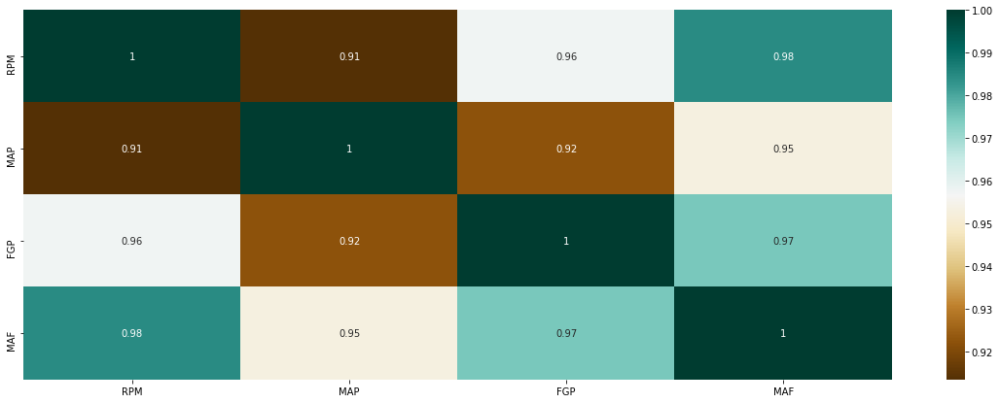

In [20]:
# Grafički prikaz korelacione matrice
corrMatrix_mlr = dataset_mlr.corr()
print("\n************************************************************************************************")
print("***************** Grafička Korelaciona Matrica (Multiple linear Regression) ********************")
print("************************************************************************************************")
print("\n*********** NUMERIČKA********************")
print (corrMatrix_mlr) # Numrerički prikaz korelacione matrice
print("\n*********** GRAFIČKA********************")
plt.figure(figsize=(20,7))

sns.heatmap(corrMatrix_mlr,cmap="BrBG", annot=True)




---


- **ALOKACIJA MATRICE OBELEŽIJA**

In [21]:
X_mlr = dataset_mlr.iloc[:, :-1].values # Alokacija Matrice Obeležija / Nezavisnih Promenjivih (eng. Independent variables)
y_mlr = dataset_mlr.iloc[:, -1].values # Alokacija Zavisne Promenjive (eng. Dependent variable) MAF sernzora automobila
print("**************************************************************")
print("**************** KREIRAN PANDAs DATA FREJM ******************")
print("**************************************************************\n")
print("*************************   X   ************************")
print(X_mlr)
print("\n\n\n*************************   y   ************************")
print(y_mlr)

# Razdvajanje na trerning i testni skup
from sklearn.model_selection import train_test_split
X_train_mlr, X_test_mlr, y_train_mlr, y_test_mlr = train_test_split(X_mlr, y_mlr, test_size = 0.2, random_state = 0)

**************************************************************
**************** KREIRAN PANDAs DATA FREJM ******************
**************************************************************

*************************   X   ************************
[[  946.      87.   23580.  ]
 [  947.      87.   23730.  ]
 [  950.75    87.   25820.  ]
 ...
 [  878.75    87.   24510.  ]
 [  879.25    87.   26730.  ]
 [  878.75    87.   23680.  ]]



*************************   y   ************************
[11.42 11.52 11.87 ...  9.41  9.5   9.57]


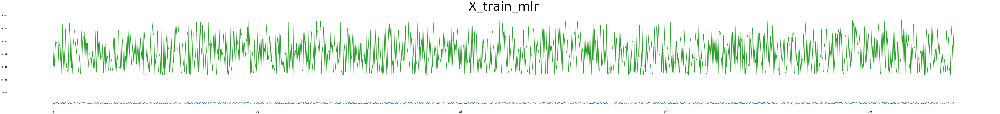

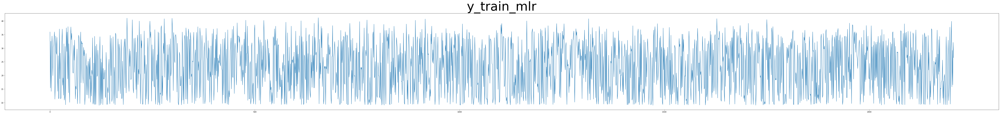

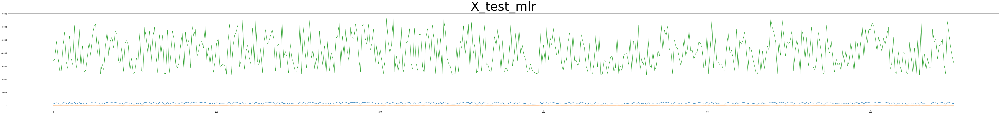

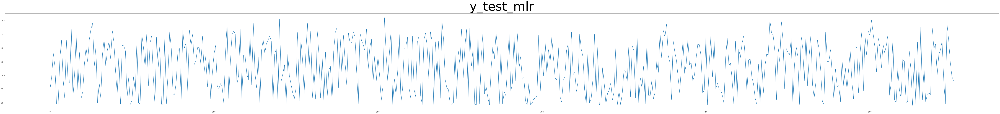

In [22]:


# Grafički prikaz - Plot rezultata svih obležija
plt.figure(figsize=(100,10))
plt.plot(X_train_mlr)
plt.title("X_train_mlr", fontsize=70, color='black') 
plt.show()
 
plt.figure(figsize=(100,10))
plt.plot(y_train_mlr)
plt.title("y_train_mlr", fontsize=70, color='black') 
plt.show()
 
plt.figure(figsize=(100,10))
plt.plot(X_test_mlr)
plt.title("X_test_mlr", fontsize=70, color='black') 
plt.show()
 
 
plt.figure(figsize=(100,10))
plt.plot(y_test_mlr)
plt.title("y_test_mlr", fontsize=70, color='black') 
plt.show()



---



- **TRERNING DATASETA VIŠETRUKOM LINEARNOM REGRESIJOM**

In [23]:
#X_with_constant = sm.add_constant(X_train_mlr)
model = sm.OLS(y_train_mlr, X_train_mlr)
resultsaaa = model.fit()
resultsaaa.params
#print(resultsaaa.summary())

array([ 0.0116343 , -0.08628004,  0.00030526])

In [24]:
print(resultsaaa.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.995
Model:                            OLS   Adj. R-squared (uncentered):              0.995
Method:                 Least Squares   F-statistic:                          1.591e+05
Date:                Mon, 24 May 2021   Prob (F-statistic):                        0.00
Time:                        21:56:35   Log-Likelihood:                         -4273.7
No. Observations:                2207   AIC:                                      8553.
Df Residuals:                    2204   BIC:                                      8571.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

[[17.46 14.78]
 [19.55 19.17]
 [28.79 28.15]
 ...
 [27.21 24.84]
 [21.05 19.5 ]
 [18.37 18.12]]


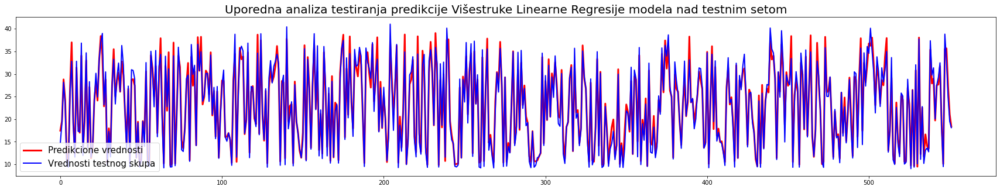

In [43]:
# Predikcija Test set rezultata
y_pred_mlr = resultsaaa.predict(X_test_mlr)

np.set_printoptions(precision=2)
print(np.concatenate((y_pred_mlr.reshape(len(y_pred_mlr),1), y_test_mlr.reshape(len(y_test_mlr),1)),1))

# Vizualizacija rezultata nad testnim setom 
plt.figure(figsize=(30,5))
plt.plot(y_pred_mlr, label='Predikcione vrednosti', linewidth=3, color = 'red')
plt.plot(y_test_mlr, label='Vrednosti testnog skupa', linewidth=2, color = 'blue')
plt.title("Uporedna analiza testiranja predikcije Višestruke Linearne Regresije modela nad testnim setom", fontsize=20) 
plt.legend(loc="lower left", fontsize=15)
plt.show()

[[16.37 14.78]
 [19.06 19.17]
 [29.08 28.15]
 ...
 [27.13 24.84]
 [20.36 19.5 ]
 [18.03 18.12]]


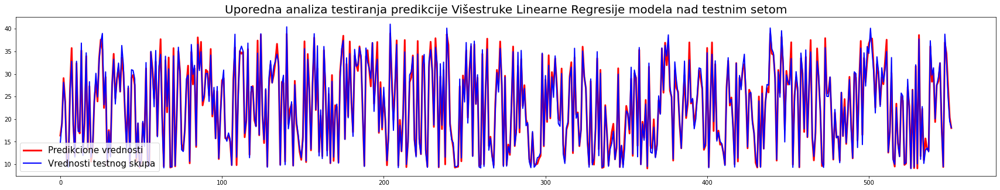

In [30]:
# Linearna Regresija trerning nad testnim setom
regressor_mlr = LinearRegression()
regressor_mlr.fit(X_train_mlr, y_train_mlr)

# Predikcija Test set rezultata
y_pred_mlr = regressor_mlr.predict(X_test_mlr)

np.set_printoptions(precision=2)
print(np.concatenate((y_pred_mlr.reshape(len(y_pred_mlr),1), y_test_mlr.reshape(len(y_test_mlr),1)),1))

# Vizualizacija rezultata nad testnim setom 
plt.figure(figsize=(30,5))
plt.plot(y_pred_mlr, label='Predikcione vrednosti', linewidth=3, color = 'red')
plt.plot(y_test_mlr, label='Vrednosti testnog skupa', linewidth=2, color = 'blue')
plt.title("Uporedna analiza testiranja predikcije Višestruke Linearne Regresije modela nad testnim setom", fontsize=20) 
plt.legend(loc="lower left", fontsize=15)
plt.show()



---



- **EVALUACIJA NAUČENOG MODELA VIŠESTRUKE LINEARNE REGRESIJE**

In [ ]:
# Evaluacija naučenog modela Višestruke Linearne Regresije
print('***************************************************************************************************')
print('*********** Evaluacija naučenog modela Višestruke Linearne Regresije - TESTNI PODACI **************')
print('***************************************************************************************************')

print('Mean squared error: %.2f'
      % mean_squared_error(y_test_mlr, y_pred_mlr))
print('Coefficient of determination: %.2f'
      % r2_score(y_test_mlr, y_pred_mlr))
mse_mlr = mean_squared_error(y_test_mlr, y_pred_mlr)
print("\nRegresiono stablo:")
print("Srednja kvadratna greška na testnom skupu (MSE) =", round(mse_mlr, 2))
evs_mlr = explained_variance_score(y_test_mlr, y_pred_mlr) 
print('Coefficient of determination: %.2f'  % evs_mlr)

***************************************************************************************************
*********** Evaluacija naučenog modela Višestruke Linearne Regresije - TESTNI PODACI **************
***************************************************************************************************
Mean squared error: 0.75
Coefficient of determination: 0.99

Regresiono stablo:
Srednja kvadratna greška na testnom skupu (MSE) = 0.75
Coefficient of determination: 0.99


In [ ]:
import statsmodels.api as sm
est = sm.OLS(y_pred_mlr, y_test_mlr)
est2 = est.fit()
print(est2.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          4.489e+05
Date:                Mon, 24 May 2021   Prob (F-statistic):                        0.00
Time:                        11:48:21   Log-Likelihood:                         -702.41
No. Observations:                 552   AIC:                                      1407.
Df Residuals:                     551   BIC:                                      1411.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------



---



- ***Provera jednog frejma*** (*Višestruka Linearna Regresija*)

In [ ]:
print('RPM = 1396.5\nMAP = 99\nFGRP = 32100\nOčekivana vrednost MAF senzora = 17.17\n')
print("Predikciona vrednost MAF senzora: " + str(regressor_mlr.predict([[1396.5, 99, 32100]])))

RPM = 1396.5
MAP = 99
FGRP = 32100
Očekivana vrednost MAF senzora = 17.17

Predikciona vrednost MAF senzora: [17.38]


In [ ]:
import joblib

filename_mlr_model = 'golf-VI-mlr-model.pkl'
joblib.dump(regressor_mlr, filename_mlr_model)

['golf-VI-mlr-model.pkl']

In [ ]:
# load the model from disk
clf2 = joblib.load(filename_mlr_model)
array_test = np.array([2468, 141, 65170])
podaci = array_test.reshape(1, 3)
result = clf2.predict(podaci)
print(result)

[39.47]




---



###5.4 RANDOM FOREST ANSEMBLI

In [ ]:

 
# Importing the dataset
dataset_rf = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CAN-DATASET/MASTER DATASET/golf-master-canbus_dataset.csv')
dataset_rf.columns=['RPM','MAP','FGRP','MAF']
print(dataset_rf.keys())
print(dataset_rf.isnull().sum())
print(dataset_rf.shape)

 
correlation_matrix_rf = dataset_rf.corr().round(2)

 
print(dataset_rf.describe())
print('***************')
X_rf = dataset_rf.iloc[:, :-1].values # Alokacija Matrice Obeležija / Nezavisnih Promenjivih (eng. Independent variables)
y_rf = dataset_rf.iloc[:, -1].values # Alokacija Zavisne Promenjive (eng. Dependent variable) MAF sernzora automobila
 

 
from sklearn.model_selection import train_test_split
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.2, random_state=0)
 
# Feature Scaling
#from sklearn.preprocessing import StandardScaler
#sc = StandardScaler()
#X_train = sc.fit_transform(X_train)
#X_test = sc.transform(X_test)
  
print('**************************************')


Index(['RPM', 'MAP', 'FGRP', 'MAF'], dtype='object')
RPM     0
MAP     0
FGRP    0
MAF     0
dtype: int64
(2759, 4)
               RPM          MAP          FGRP          MAF
count  2759.000000  2759.000000   2759.000000  2759.000000
mean   1704.693095   107.039507  41018.611816    22.990743
std     537.372769    14.925178  12051.393629     9.137581
min     812.500000    87.000000  23310.000000     9.000000
25%    1203.625000    93.000000  30320.000000    14.385000
50%    1785.500000   106.000000  40190.000000    23.300000
75%    2146.750000   119.000000  50630.000000    30.975000
max    2611.500000   145.000000  68150.000000    41.190000
***************
**************************************


In [ ]:
from sklearn.ensemble import RandomForestRegressor
  
regressor_rf = RandomForestRegressor(n_estimators=100, random_state = 0, oob_score= True)
regressor_rf.fit(X_train_rf, y_train_rf)
print('Out Of Bag(OBD) Rezultat: ', regressor_rf.score(X_test_rf, y_test_rf))

Out Of Bag(OBD) Rezultat:  0.9936480911040367


*******************************
*******************************
[[15.11 14.78]
 [19.14 19.17]
 [28.65 28.15]
 ...
 [26.06 24.84]
 [19.53 19.5 ]
 [18.13 18.12]]


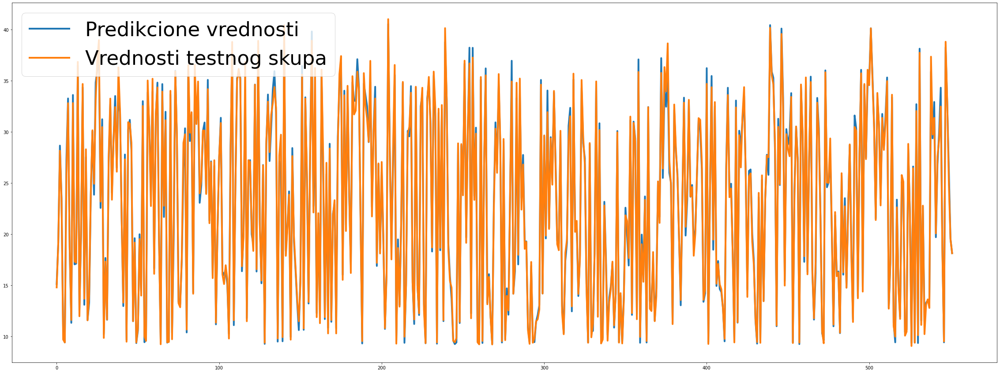

In [ ]:

print("*******************************") 
#print(X_test[50:250]) 
y_pred_rf = regressor_rf.predict(X_test_rf)
print("*******************************") 

np.set_printoptions(precision=2)
print(np.concatenate((y_pred_rf.reshape(len(y_pred_rf), 1), y_test_rf.reshape(len(y_test_rf),1)), 1))

plt.figure(figsize=(40,15))
plt.plot(y_pred_rf, label='Predikcione vrednosti', linewidth=4)
plt.plot(y_test_rf, label='Vrednosti testnog skupa', linewidth=4)
plt.legend(loc="upper left", fontsize=45)
plt.show()

In [ ]:
import statsmodels.api as sm
est = sm.OLS(y_pred_rf, y_test_rf)
est2 = est.fit()
print(est2.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          6.280e+05
Date:                Mon, 24 May 2021   Prob (F-statistic):                        0.00
Time:                        11:50:56   Log-Likelihood:                         -610.23
No. Observations:                 552   AIC:                                      1222.
Df Residuals:                     551   BIC:                                      1227.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [ ]:
import math
y_actual = y_test_rf
y_predicted = y_pred_rf
 
MSE = np.square(np.subtract(y_actual,y_predicted)).mean() 
 
RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)

Root Mean Square Error:

0.7311127155505758


### TEST NAD 100 SAMPLOVA RANDOM FOREST

*******************************
*******************************
[[10.57 10.83]
 [19.98 19.51]
 [14.38 13.98]
 [33.   32.52]
 [ 9.42 10.  ]
 [ 9.65  9.55]
 [33.87 35.02]
 [30.55 30.2 ]
 [24.12 22.74]
 [33.93 35.19]
 [16.63 16.11]
 [31.52 31.72]
 [34.81 34.34]
 [19.44 19.36]
 [ 9.45  9.22]
 [34.67 33.93]
 [21.67 22.77]
 [31.96 31.13]
 [ 9.38  9.42]
 [ 9.51  9.44]
 [33.66 34.01]
 [10.33  9.71]
 [19.34 21.01]
 [35.97 35.92]
 [29.31 29.67]
 [13.35 13.23]
 [13.11 12.84]
 [17.51 17.84]
 [26.38 28.93]
 [30.34 29.76]
 [10.38 10.66]
 [36.12 36.52]
 [29.1  29.91]
 [31.88 31.92]
 [14.27 14.16]
 [35.5  36.57]
 [31.1  30.76]
 [33.9  34.92]
 [23.06 23.98]
 [24.74 25.3 ]
 [30.06 30.12]
 [30.91 30.12]
 [24.03 23.92]
 [35.08 34.17]
 [21.3  21.06]
 [27.11 27.03]
 [15.9  15.69]
 [26.68 27.22]
 [11.17 11.34]
 [20.57 20.57]
 [27.52 27.61]
 [31.37 30.86]
 [16.32 16.06]
 [15.96 15.11]
 [16.6  16.95]
 [15.03 15.6 ]
 [10.23  9.78]
 [28.67 27.89]
 [37.56 38.79]
 [11.09 11.58]
 [25.02 24.74]
 [35.25 34.99]
 [35.5

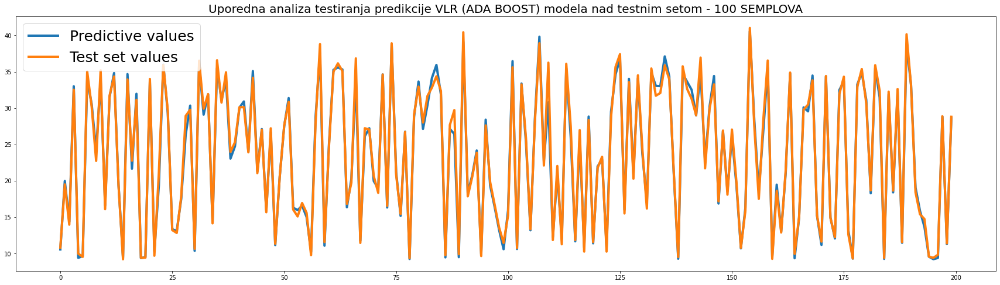

In [ ]:
print("*******************************") 
#print(X_test[50:250]) 

print("*******************************") 
X_test_small_rf = X_test_rf[50:250]
y_test_small_rf = y_test_rf[50:250]

y_pred_rf_small = regressor_rf.predict(X_test_small_rf)

np.set_printoptions(precision=2)
print(np.concatenate((y_pred_rf_small.reshape(len(y_pred_rf_small), 1), y_test_small_rf.reshape(len(y_test_small_rf),1)), 1))



plt.figure(figsize=(30,8))
plt.title("Uporedna analiza testiranja predikcije (RANDOM FOREST) modela nad testnim setom - 100 SEMPLOVA", fontsize=20) 
plt.plot(y_pred_rf_small, label='Predictive values', linewidth=4)
plt.plot(y_test_small_rf, label='Test set values', linewidth=4)
plt.legend(loc="upper left", fontsize=25)
plt.show()

### Čuvanje naučenog modela RANDOM FOREST

In [ ]:

import joblib

filename_rf_model = 'golf-VI-rf-model.pkl'
joblib.dump(regressor_rf, filename_rf_model)

###5.3 VIŠETRUKA LINEARNA REGRESIJA (*ADA BOOST*)

In [ ]:
#url = '/content/drive/MyDrive/Colab Notebooks/CAN-DATASET/GOLF-4-SENZORA/GOLF-TRENING-DATASET-CSV.csv' # Uneti putanju do preuzetog dataseta
dataset_ada = pd.read_csv(url ,sep=',', usecols = ['RPM', 'MAP', 'FGP', 'MAF'])
dataset_ada.columns=['RPM', 'MAP', 'FGP', 'MAF']

X_ada = dataset_ada.iloc[:, :-1].values # Alokacija Matrice Obeležija / Nezavisnih Promenjivih (eng. Independent variables)
y_ada = dataset_ada.iloc[:, -1].values # Alokacija Zavisne Promenjive (eng. Dependent variable) MAF sernzora automobila
print("**************************************************************")
print("**************** KREIRAN PANDAs DATA FREJM ******************")
print("**************************************************************\n")
print("*************************   X_ada   ************************")
print(X_ada)
print("\n\n\n*************************   y_ada   ************************")
print(y_ada)

# Razdvajanje na trerning i testni skup
from sklearn.model_selection import train_test_split
X_train_ada, X_test_ada, y_train_ada, y_test_ada = train_test_split(X_ada, y_ada, test_size = 0.2, random_state = 0)


**************************************************************
**************** KREIRAN PANDAs DATA FREJM ******************
**************************************************************

*************************   X_ada   ************************
[[  946.      87.   23580.  ]
 [  947.      87.   23730.  ]
 [  950.75    87.   25820.  ]
 ...
 [  878.75    87.   24510.  ]
 [  879.25    87.   26730.  ]
 [  878.75    87.   23680.  ]]



*************************   y_ada   ************************
[11.42 11.52 11.87 ...  9.41  9.5   9.57]


In [ ]:
# Učenje višestrukog regresionog modela metodom AdaBoost (400 stabala)
regressor_ada = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4), n_estimators=900, random_state=0)
regressor_ada.fit(X_train_ada, y_train_ada)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                       criterion='mse',
                                                       max_depth=4,
                                                       max_features=None,
                                                       max_leaf_nodes=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                                                       presort='deprecated',
                                                       random_state=None,
                                                       splitter='best'),
                  


Adabost regresioni model od 900 stabala:
Srednja kvadratna greška na testnom skupu (MSE) = 0.72
Coefficient of determination: 0.99
[[15.06 14.78]
 [19.37 19.17]
 [28.93 28.15]
 ...
 [26.81 24.84]
 [20.17 19.5 ]
 [18.82 18.12]]


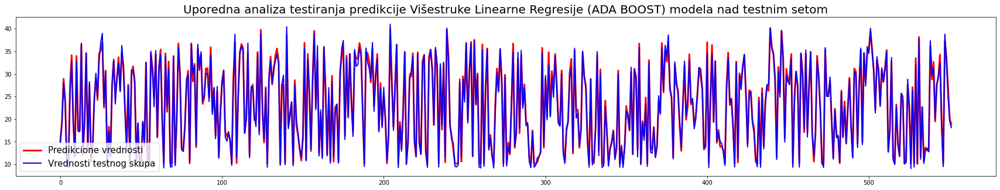

In [ ]:
# Evaluacija višestrukog regresionog modela AdaBoost
y_pred_ada = regressor_ada.predict(X_test_ada)
mse_ada = mean_squared_error(y_test_ada, y_pred_ada)
evs_ada = explained_variance_score(y_test_ada, y_pred_ada) 
print("\nAdabost regresioni model od 900 stabala:")
print("Srednja kvadratna greška na testnom skupu (MSE) =", round(mse_ada, 2))
print('Coefficient of determination: %.2f'  % evs_ada)


np.set_printoptions(precision=2)
print(np.concatenate((y_pred_ada.reshape(len(y_pred_ada), 1), y_test_ada.reshape(len(y_test_ada),1)), 1))
 
# Vizualizacija rezultata nad testnim setom 
plt.figure(figsize=(30,5))
plt.plot(y_pred_ada, label='Predikcione vrednosti', linewidth=3, color = 'red')
plt.plot(y_test_ada, label='Vrednosti testnog skupa', linewidth=2, color = 'blue')
plt.title("Uporedna analiza testiranja predikcije Višestruke Linearne Regresije (ADA BOOST) modela nad testnim setom", fontsize=20) 
plt.legend(loc="lower left", fontsize=15)
plt.show()

In [ ]:
print('RPM = 1782\nMAP = 103\nFGRP = 35830\nOčekivana vrednost MAF senzora = 21.61\n')
print("Predikciona vrednost MAF senzora: " + str(regressor_ada.predict([[1782, 	103, 35830]])))

RPM = 1782
MAP = 103
FGRP = 35830
Očekivana vrednost MAF senzora = 21.61

Predikciona vrednost MAF senzora: [22.24]


In [ ]:
import joblib

filename_ada_model = 'golf-VI-ada-model.pkl'
joblib.dump(regressor_ada, filename_ada_model)

['golf-VI-ada-model.pkl']

In [ ]:
# load the model from disk
clf2 = joblib.load(filename_ada_model)
array_test = np.array([1811.5, 108, 42140])
podaci = array_test.reshape(1, 3)
result = clf2.predict(podaci)
print(result)

[24.34]
